In [ ]:
from rasterstats import zonal_stats, point_query, gen_zonal_stats
import keras
import rasterio
import rtree
from keras import backend as K
from keras.optimizers import SGD, Adam
import pandas as pd
import geopandas as gpd
import os,sys
from tqdm import tqdm as tqdmn
import numpy as np
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard, CSVLogger
from keras import metrics
from keras.models import Model, load_model
from sklearn.metrics import confusion_matrix, classification_report
from keras.layers import Input
from skimage import io
from matplotlib.cm import inferno
import glob
from efficientnet import EfficientNetB0 as EfficientNet
sys.path.append("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/python_files/satellite/")
from generate_fr_ua_vhr_data import generate_car_census_data
sys.path.append("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/python_files/aerial/")
import tensorflow as tf
from keras.preprocessing import image
from keras.layers.core import Lambda
from keras.models import Sequential
from tensorflow.python.framework import ops
from functools import reduce
from scipy.stats import entropy
import pickle
from keras import backend as K
import argparse
from keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Concatenate, Input, Lambda, Multiply
from scipy.special import binom
from sklearn.model_selection import StratifiedKFold
import multiprocessing
from joblib import Parallel, delayed
from time import time
import gc
from scipy.special import binom
from keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Concatenate, Input, Lambda, Multiply
from keras.models import Model, load_model
import sys
sys.path.append("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/python_files/aerial/")
from aerial_training_utils import(generate_full_idINSPIRE, geographical_boundaries,
                                  my_preprocessor, fmeasure,recall,precision, fbeta_score)
from efficientnet import EfficientNetB0 as EfficientNet

# Global paths
BASE_DIR = "/warehouse/COMPLEXNET/jlevyabi/"
SAT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/esa/URBAN_ATLAS/"
CENSUS_DIR = BASE_DIR + 'REPLICATE_LINGSES/data_files/census_data/'
UA_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/land_ua_esa/FR/"
OUTPUT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/AERIAL_esa_URBAN_ATLAS_FR/"
MODEL_OUTPUT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/model_data/efficientnet_keras/"

# Global variables

import scipy.stats as st
from sklearn.metrics import accuracy_score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os, sys
from functools import reduce
%matplotlib inline
%config InlineBackend.figure_format = 'svg' 
plt.style.use('bmh')
BASE_DIR = "/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/"
sys.path.append(BASE_DIR + "cnes/python_files/satellite/")

from generate_fr_ua_vhr_data import *
OUTPUT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/AERIAL_esa_URBAN_ATLAS_FR/"
from tqdm import tqdm_notebook as tqdmn

RES_DIR_cat = BASE_DIR + "cnes/data_files/outputs/model_data/efficientnet_keras/2019_income_norm/"
RES_DIR_ord = BASE_DIR + "cnes/data_files/outputs/model_data/efficientnet_keras/2019_income_norm_v2/"

dic_rename = {
    'arable land (annual crops)': 'arable',
    'continuous urban fabric (s.l. > 80%)': 'vhd UF' ,
    'discontinuous dense urban fabric (s.l. 50% - 80%)':'hd UF' ,
    'discontinuous low density urban fabric (s.l. 10% - 30%)':'md UF' ,
    'discontinuous medium density urban fabric (s.l. 30% - 50%)':'ld UF' ,
    'discontinuous very low density urban fabric (s.l. < 10%)':'vld UF' ,
    'fast transit roads and associated land':'fast roads',
    'green urban areas': 'green UA',
    'herbaceous vegetation associations (natural grassland, moors...)': 'grassland',
    'industrial, commercial, public, military and private units': 'comr_indst',
    'isolated structures':'isolated',
    'land without current use':'no use',
    'mineral extraction and dump sites':'dump',
    'other roads and associated land':'roads',
    'permanent crops (vineyards, fruit trees, olive groves)':'crops',
    'port areas':'port',
    'wetland':'wetlands',
    'open spaces with little or no vegetation (beaches, dunes, bare rocks, glaciers)':'op_sp/beach',
    'railways and associated land':'railway',
    'sports and leisure facilities':'leis fac.',
}

# Dataset Overviews

In [60]:
RES_DIR_cat = BASE_DIR + "SATELSES/equirect_proj_test/equirect_proj_test/cnes/data_files/outputs/model_data/efficientnet_keras/2019_income_norm/"
RES_DIR_ord = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/model_data/efficientnet_keras/2019_income_norm_v2/"

In [2]:
from rasterstats import zonal_stats, point_query, gen_zonal_stats
import rasterio
import rtree
import pandas as pd
import geopandas as gpd
import os,sys
from tqdm import tqdm as tqdmn
import numpy as np
from skimage import io
from matplotlib.cm import inferno
import glob
sys.path.append("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/python_files/satellite/")
from generate_fr_ua_vhr_data import generate_car_census_data
sys.path.append("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/python_files/aerial/")

import scipy.stats as st
from sklearn.metrics import accuracy_score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os, sys
from functools import reduce
%matplotlib inline
%config InlineBackend.figure_format = 'svg' 
plt.style.use('bmh')


# Global paths
BASE_DIR = "/warehouse/COMPLEXNET/jlevyabi/"
SAT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/esa/URBAN_ATLAS/"
CENSUS_DIR = BASE_DIR + 'REPLICATE_LINGSES/data_files/census_data/'
UA_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/land_ua_esa/FR/"
OUTPUT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/AERIAL_esa_URBAN_ATLAS_FR/"
MODEL_OUTPUT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/model_data/efficientnet_keras/"

%matplotlib inline
%config InlineBackend.figure_format = 'svg' 
plt.style.use('bmh')

In [3]:
aerial_dir = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/ign/ORTHO_HR/"
shapes_dir = glob.glob(aerial_dir + "**/**/ORTHOHR/3*/**/*dalles.shp")

full = []
for d in shapes_dir:
    test = gpd.read_file(d)
    test["base"] = "/".join(d.split("/")[:-1])+"/"
    full.append(test)

full_dalles = gpd.GeoDataFrame(pd.concat(full))

In [7]:
sys.path.append("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/python_files/satellite/")
from generate_fr_ua_vhr_data import generate_car_census_data,generate_complete_census_data
sys.path.append("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/python_files/aerial/")
from shapely.geometry import Polygon

In [ ]:
df_car = generate_complete_census_data()
full_dalles.crs = full[0].crs
dalles_data_car_crs = full_dalles.to_crs(df_car.crs)
paris_ua = gpd.read_file(UA_DIR + "FR001L1_PARIS/Shapefiles/FR001L1_PARIS_UA2012.shp"

In [10]:
slides = gpd.GeoDataFrame(
    [Polygon(((650000,6860000),(655000,6860000), (655000,6865000), (650000,6865000),(650000,6865000)))],
    columns=["geometry"],crs=full_dalles.crs).to_crs(df_car.crs)
slides_mini = gpd.GeoDataFrame(
    [Polygon(((652000,6862500),(652000,6863000), (652500,6863000), (652500,6862500),(652000,6862500)))],
    columns=["geometry"],crs=full_dalles.crs)
polys_slides = gpd.sjoin(paris_ua,slides.to_crs(paris_ua.crs),op="intersects")
car_slides = gpd.sjoin(df_car,slides,op="intersects")

In [15]:
car_slides_plot=car_slides.to_crs(full_dalles.crs)
polys_slides_plot=polys_slides.to_crs(full_dalles.crs)

In [ ]:
f,ax = plt.subplots(1,1,figsize=(15,15))
car_slides_plot.plot("income",cmap="bwr",vmin=18000,vmax=26500,alpha=0.8,legend=True,ax=ax);
polys_slides_plot.plot("ITEM2012",ax=ax,alpha=0.4);
plt.xlim([650000,655000]);
plt.ylim([6860000,6865000]);
plt.axis("off");
plt.savefig("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/jupyter_notebooks/retest_inc.png");

# Performance Metrics

In [52]:
def get_metrics_info(data):
    pearson_df = pd.DataFrame([(int(i.split("true_")[1]),int(j.split("pred_")[1])) 
              for i in data.index for j in data.columns for k in range(int(data[j][i]))],columns=["true","pred"])
    r_pearson, _ = st.pearsonr(pearson_df.pred,pearson_df.true)
    mae = np.mean(np.abs(pearson_df.pred-pearson_df.true))    
    data_side_acc = data.copy()
    for i in data_side_acc.index:
        true_val = int(i.split("true_")[1])
        for j in data_side_acc.columns:
            pred_val = int(j.split("pred_")[1])
            if np.abs(pred_val-true_val)==1:
                data_side_acc["pred_{}".format(true_val)][i] += data_side_acc[j][i]
                data_side_acc[j][i]=0
    mod_pearson_df = pd.DataFrame([(int(i.split("true_")[1]),int(j.split("pred_")[1])) 
                               for i in data_side_acc.index for j in data_side_acc.columns
                               for k in range(int(data_side_acc[j][i]))],columns=["true","pred"])
    acc = accuracy_score(mod_pearson_df.true,mod_pearson_df.pred)    
    return(r_pearson,mae, acc)


def plot_heatmaps(data,r_score, mae_score,acc_score,ax,title,
                  cmap = "coolwarm", v_min=.04, v_max=.39,x_show=3.9,y_show =  4.9):
    data = data.iloc[::-1]
    ax.set_title(title,fontsize=15);
    real_data = data.div(data.sum(axis=1),axis="index")
    g=sns.heatmap(real_data, annot=False,  linewidths=1,linecolor="black",cmap=cmap, ax=ax,
                vmin=v_min,vmax=v_max);
    cbar = g.collections[0].colorbar
    # here set the labelsize by 20
    cbar.ax.tick_params(labelsize=12)
    g.set_xticklabels(range(1,1+NB_SES_VALUES),rotation=0);
    g.set_yticklabels(range(1,1+NB_SES_VALUES)[::-1],rotation=0);
    ax.annotate('r = %.2f\nMAE = %.2f\nAcc(±1) = %.2f'%(r_score, mae_score, acc_score),
                xy=(x_show, y_show), xycoords='data',size=12,color="white",multialignment="right",
                xytext=(-60, 7), textcoords='offset points',);
    
def get_confmat_heatmaps_just_avg(model_dir, save_name, nb_folds = 5, sel = None):
    cities = [city for city in os.listdir(model_dir) 
              if len(set([(fold_name.split("_")[1].split("-")[0])for fold_name in os.listdir(model_dir+city)
                    if fold_name.startswith("fold_") and fold_name.endswith("ses_classification_report.csv")]))>2]
    if not sel is None:
        cities = list(set(cities).intersection(set(sel)))
    N = 3
    nb_rows = int(np.ceil(len(cities)/N))
    nb_cols = N
    cs = ["Lyon","Paris","Marseille","Nice","Lille",]
    f,axes = plt.subplots(nb_rows,nb_cols,figsize=(4*nb_cols,3.2*nb_rows));
    for i_city,city in enumerate(set(cities)):
        city = cs[i_city]
        data_arr = [pd.read_csv(model_dir + "{}/fold_{}-ses_confusion_matrix.csv".format(city,k),header=-1)
                    for k in range(nb_folds)
                    if  "fold_{}-ses_confusion_matrix.csv".format(k) in os.listdir(model_dir+"%s"%city)]
        #
        r_arr, mae_arr, acc_arr = [], [], []
        for i_fold,d in enumerate(data_arr):
            d.columns = ["pred_" + str(k) for k in d.columns]
            d.index = ["true_"+ str(k) for k in d.index]
            r_pearson, mae, acc = get_metrics_info(d)
            r_arr.append(r_pearson)
            mae_arr.append(mae)
            acc_arr.append(acc)
        
        data_min = data_arr[np.argmin(mae_arr)]
        data_sum = reduce(lambda x, y: x.add(y, fill_value=0), data_arr)
        avg_r_score, avg_mae_score, avg_acc_score = get_metrics_info(data_sum)
        if nb_rows > 1:
            plot_heatmaps(data_min,avg_r_score, avg_mae_score, avg_acc_score,axes[i_city//N,i_city%N],
                          "{}".format(city))
            #axes[i_city//N,i_city%N].set_yticks([])
            if i_city != len(cities)-1:
                pass
                #axes[i_city//N,i_city%N].set_xticks([])
            axes[i_city//N,i_city%N].set_xlabel("Predicted Quantile");
            if i_city%N == 0:
                axes[i_city//N,i_city%N].set_ylabel("Observed Quantile");
        else:
            plot_heatmaps(data_min,avg_r_score, avg_mae_score, avg_acc_score,axes[i_city%N],
                          "{}".format(city))
            if i_city !=0:
                axes[i_city%N].set_yticks([])
            else:
                axes[i_city%N].set_ylabel("Observed Quantile");
            axes[i_city%N].set_xlabel("Predicted Quantile");
    f.subplots_adjust(hspace=.3, wspace=.2);
    f.delaxes(axes[-1,-1])
    for ax in [axes[1,0],axes[1,0].collections[0].colorbar.ax,
               axes[1,1],axes[1,1].collections[0].colorbar.ax]:
        x,y,w,h = ax.get_position().bounds
        x_offset = .125
        ax.set_position([x+x_offset,y,w,h])
    f.savefig(save_name,bbox_inches='tight', pad_inches=0.1);
    return f,axes
    
def get_confmat_heatmaps(model_dir, save_name, nb_folds = 5):
    cities = [city for city in os.listdir(model_dir) 
              if len(set([(fold_name.split("_")[1].split("-")[0])for fold_name in os.listdir(model_dir+city)
                    if fold_name.startswith("fold_") and fold_name.endswith("ses_classification_report.csv")]))>2]
    f,axes = plt.subplots(len(cities),nb_folds+1,figsize=(15,2*len(cities)));
    for i_city,city in enumerate(set(cities)):
        data_arr = [pd.read_csv(model_dir + "{}/fold_{}-ses_confusion_matrix.csv".format(city,k),header=-1)
                    for k in range(nb_folds)
                    if  "fold_{}-ses_confusion_matrix.csv".format(k) in os.listdir(model_dir+"%s"%city)]
        #
        for i_fold,d in enumerate(data_arr):
            d.columns = ["pred_" + str(k) for k in d.columns]
            d.index = ["true_"+ str(k) for k in d.index]
            r_pearson,mae, acc = get_metrics_info(d)
            plot_heatmaps(d,r_pearson,mae, acc,axes[i_city,i_fold],"Fold {}: {}".format(i_fold,city))
            if i_fold != 0:
                axes[i_city,i_fold].set_yticks([])
            if i_city != len(cities)-1:
                axes[i_city,i_fold].set_xticks([])
        #
        data_sum = reduce(lambda x, y: x.add(y, fill_value=0), data_arr)
        avg_r_score, avg_mae_score, avg_acc_score = get_metrics_info(data_sum)
        plot_heatmaps(data_sum,avg_r_score, avg_mae_score, avg_acc_score,axes[i_city,nb_folds],
                      "Avg all folds: {}".format(city))
        axes[i_city,nb_folds].set_yticks([])
        if i_city != len(cities)-1:
                axes[i_city,nb_folds].set_xticks([])
        
    f.subplots_adjust(hspace=.2, wspace=.5);
    f.tight_layout()                       # not strictly part of the question

    f.savefig(save_name);

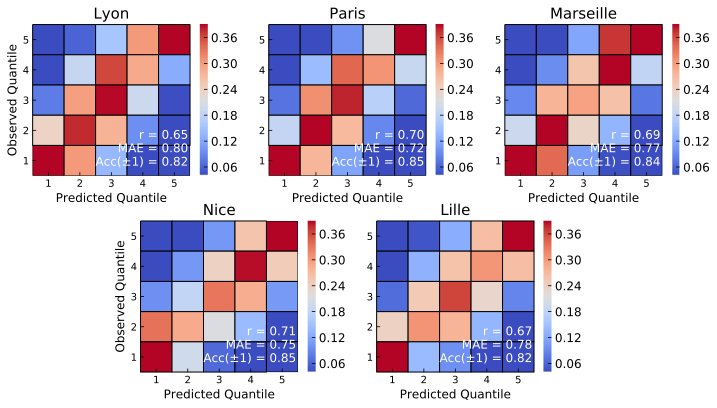

In [63]:
NB_SES_VALUES=5
f, axes = get_confmat_heatmaps_just_avg(RES_DIR_ord,
                              save_name = "/warehouse/COMPLEXNET/jlevyabi/tmp/ord_heatmap.pdf",
                              nb_folds = 5,sel = ["Lyon","Paris","Marseille","Nice","Lille",])

In [138]:
data_arr=[pd.read_csv(RES_DIR_cat+"../EB5_2019_income_norm_v2/" + "{}/fold_{}-ses_confusion_matrix.csv".format("Paris",k),header=-1)
for k in range(5)
if  "fold_{}-ses_confusion_matrix.csv".format(k) in os.listdir(RES_DIR_cat+"../EB5_2019_income_norm_v2/"+"%s"%"Paris")]
for i_fold,d in enumerate(data_arr):
    d.columns = ["pred_" + str(k) for k in d.columns]
    d.index = ["true_"+ str(k) for k in d.index]
    r_pearson,mae, acc = get_metrics_info(d)

In [59]:
data_sum = reduce(lambda x, y: x.add(y, fill_value=0), data_arr)
avg_r_score, avg_mae_score, avg_acc_score = get_metrics_info(data_sum)


In [ ]:
for i_fold,d in enumerate(data_arr):
    d.columns = ["pred_" + str(k) for k in d.columns]
    d.index = ["true_"+ str(k) for k in d.index]
    r_pearson,mae, acc = get_metrics_info(d)
    plot_heatmaps(d,r_pearson,mae, acc,axes[i_city,i_fold],"Fold {}: {}".format(i_fold,city))
    if i_fold != 0:
        axes[i_city,i_fold].set_yticks([])
    if i_city != len(cities)-1:
        axes[i_city,i_fold].set_xticks([])
#
data_sum = reduce(lambda x, y: x.add(y, fill_value=0), data_arr)
avg_r_score, avg_mae_score, avg_acc_score = get_metrics_info(data_sum)
plot_heatmaps(data_sum,avg_r_score, avg_mae_score, avg_acc_score,axes[i_city,nb_folds],
              "Avg all folds: {}".format(city))
axes[i_city,nb_folds].set_yticks([])
if i_city != len(cities)-1:
        axes[i_city,nb_folds].set_xticks([])

    f.subplots_adjust(hspace=.2, wspace=.2);


In [ ]:
get_confmat_heatmaps(RES_DIR_cat,"/warehouse/COMPLEXNET/jlevyabi/tmp/condensed_full_cities_categorical_loss.pdf");

In [ ]:
get_confmat_heatmaps(RES_DIR_ord,"/warehouse/COMPLEXNET/jlevyabi/tmp/condensed_full_cities_ordinal_loss.pdf");

In [ ]:
f,ax = plt.subplots(1,1)
sns.heatmap(pd.read_csv(RES_DIR  + "Lyon/fold_0-ses_confusion_matrix.csv",header=-1))
ax.set_xticks([]);

In [ ]:
full_info = []
full_info_frac = []
for city in os.listdir(RES_DIR):
    data = pd.read_csv(RES_DIR + city + "/ses_confusion_matrix.csv",header=-1)
    r_score, mae_score, acc_score = get_metrics_info(data)
    frac_data = data/data.sum(axis=1)
    #
    reorganized_dataset = pd.DataFrame(
        [(i,j,data[i][j]) for i in data.index for j in data.columns],
        columns=["Real","Predicted","Size"]
    )
    #
    reorganized_frac_dataset = pd.DataFrame(
        [(i,j,frac_data[i][j]) for i in frac_data.index for j in frac_data.columns],
        columns=["Real","Predicted","Size"]
    )
    reorganized_dataset["city"] = city
    reorganized_frac_dataset["city"] = city
    reorganized_dataset["log_size"] = np.log10(reorganized_dataset["Size"])
    reorganized_frac_dataset["log_size"] = np.log10(reorganized_frac_dataset["Size"])
    full_info.append(reorganized_dataset)
    full_info_frac.append(reorganized_frac_dataset)

full_reorganized_dataset = pd.concat(full_info,axis=0)
full_reorganized_dataset_frac = pd.concat(full_info_frac,axis=0)

In [ ]:
f=sns.relplot(x="Real", y="Predicted",  size="Size",legend=False,col="city",col_order=set(os.listdir(RES_DIR)),
            sizes=(0,700), alpha=.5, palette="magma",col_wrap=3,
            height=3.5, data=full_reorganized_dataset_frac);

for i,city in enumerate(set(os.listdir(RES_DIR))):
    r_score, mae_score, acc_score = get_metrics_info(
        pd.read_csv(RES_DIR + city + "/ses_confusion_matrix.csv",header=-1))
    f.axes[i].set_xticks(range(5));
    f.axes[i].set_yticks(range(5));
    f.axes[i].set_xlim([-0.3,4.3]);
    f.axes[i].set_ylim([-0.3,4.3]);
    f.axes[i].annotate('r = %.2f\nMAE = %.2f\nAcc(±1) = %.2f'%(r_score, mae_score, acc_score),
                xy=(3.9, .01), xycoords='data',size=10,
                xytext=(-60, 7), textcoords='offset points',);


In [ ]:
folds_data = pd.concat(
    [pd.read_csv(fold_file,header=0,sep=",")
     for fold_file in glob.glob(MODEL_OUTPUT_DIR+city+"/*last_best_models.csv")], axis=0).reset_index(drop=True)

best_model_city = folds_data.ix[folds_data["Validation loss"].idxmin()]["Model file"]

# Prediction Maps

In [ ]:
# Global paths
BASE_DIR = "/warehouse/COMPLEXNET/jlevyabi/"
SAT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/esa/URBAN_ATLAS/"
CENSUS_DIR = BASE_DIR + 'REPLICATE_LINGSES/data_files/census_data/'
UA_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/land_ua_esa/FR/"
OUTPUT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/AERIAL_esa_URBAN_ATLAS_FR/"
MODEL_OUTPUT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/model_data/efficientnet_keras/"
NB_SES_CLASSES = 5
ADRIAN_ALBERT_THRESHOLD = .25
INSEE_AREA = 200**2

import sys
sys.path.append("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/python_files/satellite/")
from generate_fr_ua_vhr_data import generate_car_census_data
sys.path.append("/warehouse/COMPLEXNET/jlevyabi/SATELSES/equirect_proj_test/cnes/python_files/aerial/")
from aerial_training_utils import generate_full_idINSPIRE

In [ ]:
full_im_df = generate_full_idINSPIRE(UA_DIR, OUTPUT_DIR, NB_SES_CLASSES, ADRIAN_ALBERT_THRESHOLD,
                                     INSEE_AREA, old=False)
city_assoc = pd.read_csv(OUTPUT_DIR + "city_assoc.csv")
full_im_df_ua = pd.merge(full_im_df,city_assoc,on="idINSPIRE");
full_im_df_ua = full_im_df_ua[full_im_df_ua.FUA_NAME == "Lyon"]
city_full_im_df_sampled = full_im_df_ua.to_crs({'init': 'epsg:3035'})

In [ ]:
city_full_im_df_sampled = full_im_df_ua.to_crs({'init': 'epsg:3035'})

In [ ]:
val_min = lambda x : np.percentile(x,0)
val_min.__name__ = 'qmin'
val_per20 = lambda x : np.percentile(x,20)
val_per20.__name__ = 'q20'
val_per40 = lambda x : np.percentile(x,40)
val_per40.__name__ = 'q40'
val_per60 = lambda x : np.percentile(x,60)
val_per60.__name__ = 'q60'
val_per80 = lambda x : np.percentile(x,80)
val_per80.__name__ = 'q80'
val_max = lambda x : np.percentile(x,100)
val_max.__name__ = 'qmax'

ses_city_intervals = city_full_im_df_sampled.groupby("FUA_NAME")[["income"]].agg(
    [val_min,val_per20,val_per40,val_per60,val_per80,val_max]
)

In [ ]:
ses_city_intervals

In [ ]:
from keras.applications import ResNet50
from keras.layers import GlobalAveragePooling2D, Dense, Concatenate, Lambda, Multiply
from keras.models import Model
from scipy.special import binom
import keras.backend as K
import numpy as np

In [ ]:
NB_SES_CLASSES = 5
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3),)
x=GlobalAveragePooling2D()(base_model.output)
ses_predictions = Dense(1, activation='sigmoid',name="ses_output")(x)
binomized_ses_pred = Concatenate(axis=-1)(Lambda(lambda x:[
    Multiply()([binom(NB_SES_CLASSES-1, k)*K.pow(x,k),K.pow(1-x,NB_SES_CLASSES-1-k)])
    for k in range(NB_SES_CLASSES)])(ses_predictions))

model = Model(inputs=base_model.input,outputs=binomized_ses_pred)

In [ ]:
test = model.predict(np.random.random((20,224,224,3)))

In [ ]:
pd.DataFrame.to_csv?

In [ ]:
city_full_im_df_sampled.dropna(subset=["income"],inplace=True)
income = city_full_im_df_sampled.income
class_thresholds = ses_city_intervals.ix["Lyon"]["income"].values

x_to_class[x_to_class==np.max(x_to_class)] = NB_SES_CLASSES
city_full_im_df_sampled["treated_citywise_income"] = [ str(y-1) for y in x_to_class ] 

In [ ]:
inter_col = np.linspace(0,1,NB_SES_VALUES)
dic_color = {str(k):RdBu_r(inter_col[k]) for k in range(NB_SES_VALUES)}

with plt.style.context('dark_background'):
    f,axes = plt.subplots(2,2,figsize=(12,12));
    for ses_class,ses_color in dic_color.items():
        city_df_old[city_df_old.treated_income==ses_class].to_crs(
            {"init":"epsg:3035"}).plot("treated_income",color=ses_color,edgecolor=None,
                                       linewidth=0.01,ax=axes[0,0]);
    axes[0,0].axis('off');
    
    for ses_class,ses_color in dic_color.items():
        city_df_old[city_df_old.treated_citywise_income==ses_class].to_crs(
            {"init":"epsg:3035"}).plot("treated_citywise_income",color=ses_color,edgecolor=None,
                                       linewidth=0.01,ax=axes[0,1]);
    axes[0,1].axis('off');
    
    for ses_class,ses_color in dic_color.items():
        city_df_new[city_df_new.treated_income==ses_class].to_crs(
            {"init":"epsg:3035"}).plot("treated_income",color=ses_color,edgecolor=None,
                                       linewidth=0.01,ax=axes[1,0]);
    axes[1,0].axis('off');
    
    for ses_class,ses_color in dic_color.items():
        city_df_new[city_df_new.treated_citywise_income==ses_class].to_crs(
            {"init":"epsg:3035"}).plot("treated_citywise_income",color=ses_color,edgecolor=None,
                                       linewidth=0.01,ax=axes[1,1]);
    axes[1,1].axis('off');
    f.savefig("/warehouse/COMPLEXNET/jlevyabi/tmp/"+CITY+"_income_poss.pdf");

In [2]:
from geopandas import GeoDataFrame
import geopandas as gpd
import pandas as pd
import numpy as np
import os
from matplotlib.cm import inferno,RdBu_r
import matplotlib.pyplot as plt
import seaborn as sns

BASE_DIR = "/warehouse/COMPLEXNET/jlevyabi/"
SAT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/esa/URBAN_ATLAS/"
CENSUS_DIR = BASE_DIR + 'REPLICATE_LINGSES/data_files/census_data/'
UA_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/land_ua_esa/FR/"
OUTPUT_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/AERIAL_esa_URBAN_ATLAS_FR/"
new_RES_DIR = BASE_DIR + "SATELSES/equirect_proj_test/cnes/"\
                        +"data_files/outputs/model_data/efficientnet_keras/2019_income_norm_v2/"
NB_SES_VALUES = 5
inter_col = np.linspace(0,1,NB_SES_VALUES)
dic_color = {str(k):RdBu_r(inter_col[k]) for k in range(NB_SES_VALUES)}

sns.set_style("white")
plt.style.use('bmh')

print("Generating Income Classes")
idINSPIRE2GEOM = GeoDataFrame.from_file(BASE_DIR + 'INSEE/2019/200m/shps/Filosofi2015_carreaux_200m_metropole.shp')
idINSPIRE2GEOM["income"] = idINSPIRE2GEOM["Ind_snv"]/idINSPIRE2GEOM["Ind"]
idINSPIRE2GEOM.rename({"IdINSPIRE":"idINSPIRE"},axis=1,inplace=True)
city_assoc = pd.read_csv(OUTPUT_DIR + "city_assoc.csv")
full_im_df_ua = gpd.GeoDataFrame(pd.merge(city_assoc,idINSPIRE2GEOM,on="idINSPIRE"),crs=idINSPIRE2GEOM.crs);

val_min = lambda x : np.percentile(x,0)
val_per20 = lambda x : np.percentile(x,20)
val_per40 = lambda x : np.percentile(x,40)
val_per60 = lambda x : np.percentile(x,60)
val_per80 = lambda x : np.percentile(x,80)
val_max = lambda x : np.percentile(x,100)

val_min.__name__ = 'qmin'
val_per20.__name__ = 'q20'
val_per40.__name__ = 'q40'
val_per60.__name__ = 'q60'
val_per80.__name__ = 'q80'
val_max.__name__ = 'qmax'

ses_city_intervals = full_im_df_ua.groupby("FUA_NAME")[["income"]].agg(
    [val_min,val_per20,val_per40,val_per60,val_per80,val_max]
)
df_cities = []
for city in list(ses_city_intervals.index):
    city_df_new = full_im_df_ua[full_im_df_ua.FUA_NAME==city]
    city_df_new.dropna(subset=["income"],inplace=True)
    income = city_df_new.income
    class_thresholds = ses_city_intervals.loc[city]["income"].values
    x_to_class = np.digitize(income,class_thresholds)
    x_to_class[x_to_class==np.max(x_to_class)] = NB_SES_VALUES
    city_df_new["treated_citywise_income"] = [ str(y-1) for y in x_to_class ]
    df_cities.append(city_df_new)


Generating Income Classes


/home/jlevyabi/anaconda3/envs/bv_env/lib/python3.6/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/jlevyabi/anaconda3/envs/bv_env/lib/python3.6/site-packages/ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [3]:
full_im_df_ua = gpd.GeoDataFrame(pd.concat(df_cities,axis=0),crs=full_im_df_ua.crs).sort_index()

print("Getting Predicted Classes")
predicted_cities = [city  for city in os.listdir(new_RES_DIR) if "preds" in os.listdir(new_RES_DIR+city)
                    if "full_whole_predictions.csv" in os.listdir(new_RES_DIR+city+"/preds")]
predicted_values = pd.concat([pd.read_csv(new_RES_DIR+city+"/preds/full_whole_predictions.csv")
                     for city in predicted_cities],axis=0).sort_index()
predicted_values["pred_class"] = predicted_values["pred_class"].astype(str)
full_mat = gpd.GeoDataFrame(pd.merge(full_im_df_ua[["idINSPIRE","FUA_NAME","treated_citywise_income","geometry"]],
                                     predicted_values,on="idINSPIRE"),crs=full_im_df_ua.crs)


Getting Predicted Classes


In [66]:
f = plt.figure()
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=plt.Normalize(vmin=0, vmax=NB_SES_VALUES))
sm._A = []
cbaxes = f.add_axes([0.42, .2, 0.8, 0.05]) 
cbar=plt.colorbar(sm,ticks=range(NB_SES_VALUES),cax = cbaxes,orientation="horizontal",
                  fraction=.01,);
f.savefig("/home/jlevyabi/cbar.pdf",bbox_inches='tight', pad_inches=0.1);

In [130]:
plt.colorbar?

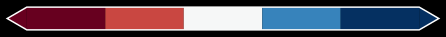

In [160]:
plt.style.use('dark_background')
f = plt.figure()
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=plt.Normalize(vmin=1, vmax=NB_SES_VALUES-1))
sm._A = []
cbaxes = f.add_axes([0.42, .2, 1, 0.08]) 
cbar=plt.colorbar(sm,ticks=[],cax = cbaxes,orientation="horizontal",extend="both",
                  fraction=.5,spacing='uniform',boundaries=range(-1,NB_SES_VALUES+2));
cbar.outline.set_linewidth(1.5)
f.savefig("/home/jlevyabi/remade_cbar.pdf",bbox_inches='tight', pad_inches=0.1);

In [142]:
f.add_axes?

# GradCAMs

## Set Image 

In [ ]:
city = "Nice"
cfg = K.tf.ConfigProto()
#      intra_op_parallelism_threads=1,
#      inter_op_parallelism_threads=1)
K.set_session(K.tf.Session(config=cfg))
#K.set_session(K.tf.Session(config=cfg))

def sjoin(left_df, right_df, how='inner', op='intersects', lsuffix='left', rsuffix='right'):
    index_left = 'index_%s' % lsuffix
    index_right = 'index_%s' % rsuffix
    if (any(left_df.columns.isin([index_left, index_right]))
            or any(right_df.columns.isin([index_left, index_right]))):
        raise ValueError("'{0}' and '{1}' cannot be names in the frames being"
                         " joined".format(index_left, index_right))
    #
    left_df = left_df.copy(deep=True)
    left_df.index = left_df.index.rename(index_left)
    left_df = left_df.reset_index()
    right_df = right_df.copy(deep=True)
    right_df.index = right_df.index.rename(index_right)
    right_df = right_df.reset_index()
    # insert the bounds in the rtree spatial index
    right_df_bounds = right_df.geometry.apply(lambda x: x.bounds)
    stream = ((i, b, None) for i, b in enumerate(right_df_bounds))
    tree_idx = rtree.index.Index(stream)
    idxmatch = (left_df.geometry.apply(lambda x: x.bounds)
                .apply(lambda x: list(tree_idx.intersection(x))))
    #
    one_to_many_idxmatch = idxmatch[idxmatch.apply(len) > 0]
    if one_to_many_idxmatch.shape[0] > 0:
        r_idx = np.concatenate(one_to_many_idxmatch.values)
        l_idx = np.concatenate([[i] * len(v) for i, v in one_to_many_idxmatch.iteritems()])
        def find_intersects(a1, a2):
            if  a1.intersects(a2):
                return (a1.intersection(a2)).area
            else:
                return 0
        predicate_d = find_intersects
        check_predicates = np.vectorize(find_intersects)
        result_one_to_many = (pd.DataFrame(np.column_stack([l_idx, r_idx,
                                                            check_predicates(left_df.geometry[l_idx],
                                                            right_df[right_df.geometry.name][r_idx])])))
        result_one_to_many.columns = ['_key_left', '_key_right', 'match_bool']
        result_one_to_many._key_left = result_one_to_many._key_left.astype(int)
        result_one_to_many._key_right = result_one_to_many._key_right.astype(int)
        result_one_to_many = pd.DataFrame(result_one_to_many[result_one_to_many['match_bool'] > 0])
        result_one_to_many = result_one_to_many.groupby("_key_right").apply(lambda x : list(x["_key_left"]))
    return result_one_to_many

def my_preprocessor(image):
    image = np.array(image)
    image = (image - np.min(image))/(.1 + np.max(image)-np.min(image))
    return image

#Base class for saliency masks. Alone, this class doesn't do anything.
class SaliencyMask(object):
    """Base class for saliency masks. Alone, this class doesn't do anything."""
    def __init__(self, model, output_index=0):
        """Constructs a SaliencyMask.
        Args:
            model: the keras model used to make prediction
            output_index: the index of the node in the last layer to take derivative on
        """
        pass
    #
    def get_mask(self, input_image):
        """Returns an unsmoothed mask.
        Args:
            input_image: input image with shape (H, W, 3).
        """
        pass
    #
    def get_smoothed_mask(self, input_image, stdev_spread=1, nsamples=100):
        """Returns a mask that is smoothed with the SmoothGrad method.
        Args:
            input_image: input image with shape (H, W, 3).
        """
        stdev = stdev_spread * (np.max(input_image) - np.min(input_image))
        total_gradients = np.zeros_like(input_image)
        for i in range(nsamples):
            noise = np.random.normal(0, stdev, input_image.shape)
            x_value_plus_noise = input_image + noise
            total_gradients += self.get_mask(x_value_plus_noise)
        return total_gradients / nsamples

#A SaliencyMask class that computes saliency masks with a gradient.
class GradientSaliency(SaliencyMask):
    """A SaliencyMask class that computes saliency masks with a gradient."""
    def __init__(self, model, output_index=0):
        # Define the function to compute the gradient
        input_tensors = [model.input,        # placeholder for input image tensor
                         K.learning_phase(), # placeholder for mode (train or test) tense
                        ]
        gradients = model.optimizer.get_gradients(model.output[0][output_index], model.input)
        self.compute_gradients = K.function(inputs=input_tensors, outputs=gradients)
    #
    def get_mask(self, input_image):
        """Returns a vanilla gradient mask.
        Args:
            input_image: input image with shape (H, W, 3).
        """
        # Execute the function to compute the gradient
        x_value = np.expand_dims(input_image, axis=0)
        gradients = self.compute_gradients([x_value, 0])[0][0]
        return gradients

#A SaliencyMask class that computes saliency masks with GuidedBackProp.
class GuidedBackprop(SaliencyMask):
    """A SaliencyMask class that computes saliency masks with GuidedBackProp.
    This implementation copies the TensorFlow graph to a new graph with the ReLU
    gradient overwritten as in the paper: https://arxiv.org/abs/1412.6806
    """
    GuidedReluRegistered = False
    def __init__(self, model, output_index=0, custom_loss=None):
        #
        model_save_loc = '/tmp/gbbis_keras_cpu_{}_{}.h5'.format(city,output_index)
        session_save_loc = '/tmp/guided_backpropbis_ckpt_cpu_{}_{}'.format(city,output_index)
        graph_save_loc = '/tmp/guided_backpropbis_ckpt_cpu_{}_{}.meta'.format(city,output_index)
        #
        """Constructs a GuidedBackprop SaliencyMask."""
        if GuidedBackprop.GuidedReluRegistered is False:
            @tf.RegisterGradient("GuidedRelu")
            def _GuidedReluGrad(op, grad):
                gate_g = tf.cast(grad > 0, "float32")
                gate_y = tf.cast(op.outputs[0] > 0, "float32")
                return gate_y * gate_g * grad
        GuidedBackprop.GuidedReluRegistered = True
        """ 
            Create a dummy session to set the learning phase to 0 (test mode in keras) without 
            inteferring with the session in the original keras model. This is a workaround
            for the problem that tf.gradients returns error with keras models that contains 
            Dropout or BatchNormalization.

            Basic Idea: save keras model => create new keras model with learning phase set to 0 => save
            the tensorflow graph => create new tensorflow graph with ReLU replaced by GuidedReLU.
        """   
        model.save(model_save_loc) 
        with tf.Graph().as_default(): 
            with tf.Session(config=cfg).as_default(): 
                K.set_learning_phase(0)
                load_model(model_save_loc,
                           custom_objects={"custom_loss":custom_loss,"precision":precision,
                                           "recall":recall,"fbeta_score":fbeta_score,"fmeasure":fmeasure,
                                           "binom":binom,"Multiply":Multiply,"Concatenate":Concatenate,
                                           "Lambda":Lambda,"NB_SES_CLASSES":NB_SES_CLASSES})
                session = K.get_session()
                tf.train.export_meta_graph()
                saver = tf.train.Saver()
                saver.save(session,session_save_loc)
        self.guided_graph = tf.Graph()
        with self.guided_graph.as_default():
            self.guided_sess = tf.Session(graph = self.guided_graph,config=cfg)
            with self.guided_graph.gradient_override_map({'Relu': 'GuidedRelu'}):
                saver = tf.train.import_meta_graph(graph_save_loc)
                saver.restore(self.guided_sess, session_save_loc)
                self.imported_y = self.guided_graph.get_tensor_by_name(model.output.name)[0][output_index]
                self.imported_x = self.guided_graph.get_tensor_by_name(model.input.name)
                self.guided_grads_node = tf.gradients(self.imported_y, self.imported_x)
        gc.collect()

    #
    def get_mask(self, input_image):
        """Returns a GuidedBackprop mask."""
        x_value = np.expand_dims(input_image, axis=0)
        guided_feed_dict = {}
        guided_feed_dict[self.imported_x] = x_value
        gradients = self.guided_sess.run(self.guided_grads_node, feed_dict = guided_feed_dict)[0][0]
        return gradients
    #
    def get_mult_mask(self, input_images):
        """Returns a GuidedBackprop mask."""
        guided_feed_dict = {}
        guided_feed_dict[self.imported_x] = input_images
        gradients = self.guided_sess.run(self.guided_grads_node, feed_dict = guided_feed_dict)[0][0]
        return gradients

# Yields Intersection of Area between polygons
def find_intersects(a1, a2):
    if  a1.intersects(a2):
        return (a1.intersection(a2)).area
    else:
        return 0

# Spatial Join for assigning cells to SES
def sjoin(left_df, right_df, how='inner', op='intersects', lsuffix='left', rsuffix='right'):
    index_left = 'index_%s' % lsuffix
    index_right = 'index_%s' % rsuffix
    if (any(left_df.columns.isin([index_left, index_right]))
            or any(right_df.columns.isin([index_left, index_right]))):
        raise ValueError("'{0}' and '{1}' cannot be names in the frames being"
                         " joined".format(index_left, index_right))
    #
    left_df = left_df.copy(deep=True)
    left_df.index = left_df.index.rename(index_left)
    left_df = left_df.reset_index()
    right_df = right_df.copy(deep=True)
    right_df.index = right_df.index.rename(index_right)
    right_df = right_df.reset_index()
    # insert the bounds in the rtree spatial index
    right_df_bounds = right_df.geometry.apply(lambda x: x.bounds)
    stream = ((i, b, None) for i, b in (enumerate(right_df_bounds)))
    tree_idx = rtree.index.Index(stream)
    idxmatch = (left_df.geometry.apply(lambda x: x.bounds)
                .apply(lambda x: list(tree_idx.intersection(x))))
    #
    one_to_many_idxmatch = idxmatch[idxmatch.apply(len) > 0]
    if one_to_many_idxmatch.shape[0] > 0:
        r_idx = np.concatenate(one_to_many_idxmatch.values)
        l_idx = np.concatenate([[i] * len(v) for i, v in one_to_many_idxmatch.iteritems()])
        check_predicates = np.vectorize(find_intersects)
        result_one_to_many = (pd.DataFrame(np.column_stack([l_idx, r_idx,
                                                            check_predicates(left_df.geometry[l_idx],
                                                            right_df[right_df.geometry.name][r_idx])])))
        result_one_to_many.columns = ['_key_left', '_key_right', 'match_bool']
        result_one_to_many._key_left = result_one_to_many._key_left.astype(int)
        result_one_to_many._key_right = result_one_to_many._key_right.astype(int)
        result_one_to_many = pd.DataFrame(result_one_to_many[result_one_to_many['match_bool'] > 0])
        result_one_to_many = result_one_to_many.groupby("_key_right").apply(lambda x : list(x["_key_left"]))
    return result_one_to_many

#GradCAM method for visualizing input saliency for processing multiple images in one run. (MAX_BS)
def grad_cam_batch(input_model, images, classes, layer_name):
    """GradCAM method for visualizing input saliency.
    Same as grad_cam but processes multiple images in one run."""
    loss = tf.gather_nd(input_model.output, np.dstack([range(images.shape[0]), classes])[0])
    layer_output = input_model.get_layer(layer_name).output
    grads = K.gradients(loss, layer_output)[0]
    gradient_fn = K.function([input_model.input, K.learning_phase()], [layer_output, grads])
    #
    conv_output, grads_val = gradient_fn([images, 0])    
    weights = np.mean(grads_val, axis=(1, 2))
    cams = np.einsum('ijkl,il->ijk', conv_output, weights)
    #
    # Process CAMs
    new_cams = np.empty((images.shape[0], H, W))
    new_cams_rz = np.empty((images.shape[0], H, W))
    for i in range(new_cams.shape[0]):
        cam_i = cams[i] - cams[i].mean()
        cam_i = (cam_i + 1e-10) / (np.linalg.norm(cam_i, 2) + 1e-10)
        #cam_i = cams[i]
        new_cams[i] = cv2.resize(cam_i, (W, H), cv2.INTER_LINEAR)
        new_cams[i] = np.maximum(new_cams[i], 0)
        new_cams_rz[i] = new_cams[i] / new_cams[i].max()  
    del loss, layer_output, grads, gradient_fn, conv_output, grads_val
    return new_cams, new_cams_rz

# Calculates Raster Statistics
def individual_rastering(gradcam_bg,t,test_cores,class_,time_id):
    raster_loc = BASE_DIR + 'tmp/new_testbis_cpu_{}_{}_{}.tif'.format(city,time_id,class_)
    poly_loc = BASE_DIR + 'tmp/new_poly2bis_cpu_{}_{}.shp'.format(city,time_id)
    class_dataset = rasterio.open(raster_loc,'w',driver='GTiff',
                                  height=H, width=W,count=1,dtype=gradcam_bg.dtype,crs={'init': 'epsg:3035'},transform=t)
    class_dataset.write(gradcam_bg, 1)
    class_dataset.close()
    my_ops = ['sum','min','max','median','mean','count']
    test_cores[["ITEM2012","geometry"]].to_file(poly_loc)
    stats_class = zonal_stats(poly_loc,raster_loc,stats=my_ops,geojson_out=True)
    return gpd.GeoDataFrame.from_features(stats_class).rename({k:str(class_)+ "_" + k for k in my_ops},axis=1)

# Calculates TV distance within polygons in raster
def individual_totvar(gradcam_gdf,class_poor,grad_cam_poor,class_rich,grad_cam_rich,time_id):
    raster_loc_poor = BASE_DIR + 'tmp/new_testbis_cpu_{}_{}_{}.tif'.format(city,time_id,class_poor)
    raster_loc_rich = BASE_DIR + 'tmp/new_testbis_cpu_{}_{}_{}.tif'.format(city,time_id,class_rich)
    poly_loc = BASE_DIR + 'tmp/new_poly2bis_cpu_{}_{}.shp'.format(city,time_id)
    if grad_cam_poor.sum() == 0 or grad_cam_rich.sum() == 0:
        tot_var_data = sym_KL = None
    else:
        tot_var_data, sym_KL = [], []
        stats_totvar_poor = zonal_stats(poly_loc,raster_loc_poor,stats='sum',raster_out=True,)
        stats_totvar_rich = zonal_stats(poly_loc,raster_loc_rich,stats='sum',raster_out=True,)
        for k in list(gradcam_gdf.index):
            P = stats_totvar_poor[k]["mini_raster_array"].data
            P /= np.sum(P[stats_totvar_poor[k]["mini_raster_array"].mask])
            P = P[stats_totvar_poor[k]["mini_raster_array"].mask]
            #
            Q = stats_totvar_rich[k]["mini_raster_array"].data
            Q /= np.sum(Q[stats_totvar_rich[k]["mini_raster_array"].mask])
            Q = Q[stats_totvar_rich[k]["mini_raster_array"].mask]
            #
            tot_var_data.append(0.5*np.sum(np.abs(P-Q)))
            sym_KL.append(entropy(P,Q)+entropy(Q,P))
    return tot_var_data, sym_KL, raster_loc_poor, raster_loc_rich, poly_loc

# Calculates all raster statistics for one sample
def individual_statistics(gradcam_cam_poor,gradcam_bg_poor,class_poor,
                          gradcam_cam_rich,gradcam_bg_rich,class_rich,
                          t,test_core,val_idINSPIRE):
    id_core = str(time())
    gradcam_gdf_poor = individual_rastering(gradcam_bg_poor,t,test_core,class_poor,id_core)
    gradcam_gdf_rich = individual_rastering(gradcam_bg_rich,t,test_core,class_rich,id_core)
    gradcam_gdf = pd.concat([gradcam_gdf_poor,
                             gradcam_gdf_rich[['4_sum','4_min','4_max','4_median','4_mean','4_count']]],axis=1)
    tot_var_data, sym_KL, raster_loc_poor, raster_loc_rich, poly_loc = individual_totvar(gradcam_gdf,
                                                                                         class_poor,gradcam_cam_poor,
                                                                                         class_rich,gradcam_cam_rich,
                                                                                         id_core)
    os.system("rm {}".format(raster_loc_poor))
    os.system("rm {}".format(raster_loc_rich))
    os.system("rm {}".format(poly_loc))
    os.system("rm {}".format(poly_loc.replace(".shp",".shx")))
    os.system("rm {}".format(poly_loc.replace(".shp",".dbf")))
    os.system("rm {}".format(poly_loc.replace(".shp",".prj")))
    os.system("rm {}".format(poly_loc.replace(".shp",".cpg")))
    gradcam_gdf["totvar"] = tot_var_data
    gradcam_gdf["sym_KL"] = sym_KL
    gradcam_gdf["area"] = gradcam_gdf.geometry.area
    gradcam_gdf["poor_score"] = gradcam_gdf["0_sum"]/gradcam_gdf["area"]
    gradcam_gdf["rich_score"] = gradcam_gdf["4_sum"]/gradcam_gdf["area"]
    return (t,test_core,gradcam_gdf,val_idINSPIRE)


# Preprocess Image
def load_prepared_img(im_name):
    return cv2.resize(my_preprocessor(cv2.imread(im_name)),IMG_SIZE)    

# Runs through inner batch  for 1 outer batch iteration
def serialize_gradcaming(model,guided_bprop,sample_census_cell_imnames,indices,ind_batched_list,class_):
    # CAM
    full_grad_cams, full_grad_cam_bgs = [], []
    # Guided BackPropation  
    print("Batching")
    for i in tqdmn(range(len(ind_batched_list)-1)):
        batch_sample_census_cell_imnames = sample_census_cell_imnames[ind_batched_list[i]:ind_batched_list[i+1]]
        batch_sample_census_cell_imgs = [load_prepared_img(im) for im in batch_sample_census_cell_imnames]
        batch_classes = [class_ for j in range(ind_batched_list[i],ind_batched_list[i+1])]
        grad_cams, grad_cam_rzs = grad_cam_batch(model,np.stack(batch_sample_census_cell_imgs),
                                                         batch_classes, conv_name)
        masks = [guided_bprop.get_mask(img) for img in batch_sample_census_cell_imgs]
        images = np.stack([np.sum(np.abs(mask), axis=2) for mask in masks])
        # Combination
        gradcam_bgs = np.multiply(grad_cam_rzs,images)
        upper_percs = np.percentile(gradcam_bgs,99,(1,2))
        gradcam_bgs = np.minimum(gradcam_bgs,np.stack([k *np.ones((W,H)) for k in upper_percs]))
        full_grad_cams.append(grad_cams)
        full_grad_cam_bgs.append(gradcam_bgs)
    full_grad_cams = np.vstack(full_grad_cams) if len(full_grad_cams) > 1 else full_grad_cams
    full_grad_cam_bgs = np.vstack(full_grad_cam_bgs) if  len(full_grad_cam_bgs) > 1 else full_grad_cam_bgs
    return full_grad_cams,full_grad_cam_bgs





In [163]:
import glob
geo_census = generate_car_census_data()
ua_data = gpd.GeoDataFrame(pd.concat([gpd.read_file(d) 
                                       for d in tqdmn(glob.glob(UA_DIR+"**/Shapefiles/*UA2012.shp"))]))
ua_data.crs = {'init': 'epsg:3035'}

treat_class = lambda x :x.lower()\
     .replace(":","")\
     .replace("  "," ")\
     .replace("…","...")\
     .replace(", ("," (")\
     .replace(", ("," (")\
     .replace("moorsâ\x80¦","moors...")

ua_data["ITEM2012"] = list(map(treat_class,ua_data["ITEM2012"]))
#ua_data["ITEM2012"] = [dic_rename[k] if k in dic_rename else k for k in ua_data.ITEM2012]

pre_dic = pd.read_csv(OUTPUT_DIR + "../census_data/squares_to_ses.csv" )
pre_dic.dropna(subset=["income"],inplace=True)

image_files = [os.path.join(inter_sat_dir,im_file) for inter_sat_dir in tqdmn(os.listdir(OUTPUT_DIR))
               if not inter_sat_dir.endswith(".csv")
               for im_file in os.listdir(OUTPUT_DIR + inter_sat_dir) if im_file.endswith(".png")]

im_df = pd.DataFrame()
im_df["path2im"] = image_files
im_df["idINSPIRE"] = [k.split("/")[-1].split(".")[0].split("_")[-1] for k in image_files]
full_im_df = pd.merge(pre_dic,im_df,on="idINSPIRE")

#check_void = parallel_make_dataset(full_im_df.path2im)
#void_df = pd.DataFrame(check_void,columns=["path2im","non_void"])
#full_im_df = pd.merge(full_im_df,void_df,on="path2im")
#full_im_df = full_im_df[full_im_df.non_void]
full_im_df.reset_index(drop=True,inplace=True)

NB_CLASSES = 5
income = full_im_df.income
class_thresholds = [np.percentile(income,k) for k in np.linspace(0,100,NB_CLASSES +1 )]
x_to_class = np.digitize(income,class_thresholds)
x_to_class[x_to_class==np.max(x_to_class)] = NB_CLASSES
full_im_df["treated_income"] = [ str(y-1) for y in x_to_class ]

full_im_df_sampled = full_im_df


100%|██████████| 157/157 [01:58<00:00,  1.32it/s]

In [164]:
full_im_df_sampled.head()

,idINSPIRE,income,pov_rate,i_basr,ind_c,nbcar_car,path2im,treated_income
0,CRS3035RES200mN2070200E4214200,21617.136364,0.066667,0,1.0,9.0,02A/FR_URBANATLAS_200m_CRS3035RES200mN2070200E...,3
1,CRS3035RES200mN2070400E4214000,21617.136364,0.066667,0,4.0,9.0,02A/FR_URBANATLAS_200m_CRS3035RES200mN2070400E...,3
2,CRS3035RES200mN2070400E4214400,21617.136364,0.066667,0,1.0,9.0,02A/FR_URBANATLAS_200m_CRS3035RES200mN2070400E...,3
3,CRS3035RES200mN2070400E4214600,21617.136364,0.066667,0,1.0,9.0,02A/FR_URBANATLAS_200m_CRS3035RES200mN2070400E...,3
4,CRS3035RES200mN2070600E4214800,21617.136364,0.066667,0,1.0,9.0,02A/FR_URBANATLAS_200m_CRS3035RES200mN2070600E...,3


In [ ]:
import cv2
# Image Related
W = H = 800
IMG_SIZE = (W, H)
INPUT_SHAPE = (IMG_SIZE[0], IMG_SIZE[1], 3)

# SES/UA Related
NB_SES_CLASSES = 5
ADRIAN_ALBERT_THRESHOLD = .25
INSEE_AREA = 200*200

# Model Related
conv_name = 'conv2d_65'
input_name = 'input_1'
#sample_census_cell_data = full_im_df_sampled[[len(x.split("/")[0].split("_"))==1 for x in full_im_df_sampled.path2im]].sample(1).iloc[0]
sample_census_cell_data = full_im_df_sampled[full_im_df_sampled.idINSPIRE=="CRS3035RES200mN2290800E4102200"].iloc[0]
sample_census_cell_img = cv2.resize(my_preprocessor(cv2.imread(OUTPUT_DIR + sample_census_cell_data.path2im)),
                                    IMG_SIZE)
sample_census_cell_label = sample_census_cell_data.treated_income

sample_census_cell_input = np.expand_dims(sample_census_cell_img,axis=0)

In [167]:
gdf_full_im_df_sampled = gpd.GeoDataFrame(pd.merge(full_im_df_sampled.drop("ind_c",axis=1),
                                                   geo_census,on="idINSPIRE"))
gdf_full_im_df_sampled.crs = geo_census.crs

In [168]:
test_idINSPIRE = gdf_full_im_df_sampled[
    gdf_full_im_df_sampled.idINSPIRE==sample_census_cell_data.idINSPIRE].to_crs({'init': 'epsg:3035'})

In [171]:
import rasterio
import rtree
from geopandas import sjoin
test = sjoin(ua_data,test_idINSPIRE)

In [ ]:
f,ax = plt.subplots(1,1,figsize=(5,5));
ua_data.iloc[test[0]].plot("ITEM2012",ax=ax);
test_idINSPIRE.plot(edgecolor="red",facecolor="none",linewidth=2,ax=ax);

In [ ]:
from rasterio.transform import from_bounds
t = from_bounds(test_idINSPIRE.bounds.minx.values[0]+0, test_idINSPIRE.bounds.miny.values[0]+0,
                test_idINSPIRE.bounds.maxx.values[0]+0, test_idINSPIRE.bounds.maxy.values[0]+0,
                sample_census_cell_img.shape[0], sample_census_cell_img.shape[1],)

In [175]:
UA_COLS = list(set(ua_data.ITEM2012))

In [ ]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap,to_rgba
test_cores = gpd.overlay(ua_data.iloc[test[0]], test_idINSPIRE, how='intersection')

alpha = .4
newcmp = ListedColormap(np.vstack([
    to_rgba("gold", alpha=alpha),
    to_rgba("forestgreen", alpha=alpha),
    to_rgba("red", alpha=alpha),
    to_rgba("darkorange", alpha=alpha),
    to_rgba("black", alpha=alpha),
    to_rgba("deepskyblue", alpha=alpha),
]))

In [13]:
class_poor = 0
class_rich = NB_SES_CLASSES - 1
MODEL_OUTPUT_DIR  = BASE_DIR + "SATELSES/equirect_proj_test/cnes/data_files/outputs/model_data/efficientnet_keras/"

# Load the last best model
dic_load_model = {
    "precision":precision,
    "recall":recall,
    "fbeta_score":fbeta_score,
    "fmeasure":fmeasure,
    "binom":binom,
    "Multiply":Multiply,
    "Concatenate":Concatenate,
    "Lambda":Lambda,
    "NB_SES_CLASSES":NB_SES_CLASSES,
}

efficientnet_model = load_model(
    MODEL_OUTPUT_DIR + "2019_income_norm_v2/Nice/" + "fold_0-lastbest-0.hdf5",custom_objects=dic_load_model)

efficientnet_model.compile(loss='categorical_crossentropy', optimizer='adam')
guided_bprop_poor = GuidedBackprop(efficientnet_model,output_index=class_poor);
guided_bprop_rich = GuidedBackprop(efficientnet_model,output_index=class_rich);

Instructions for updating:
Shapes are always computed; don't use the compute_shapes as it has no effect.
INFO:tensorflow:Restoring parameters from /tmp/guided_backpropbis_ckpt_cpu_Nice_0
INFO:tensorflow:Restoring parameters from /tmp/guided_backpropbis_ckpt_cpu_Nice_4


In [14]:
batch_sample_census_cell_imgs = [sample_census_cell_img]
batch_classes_poor = [class_poor]
batch_classes_rich = [class_rich]
grad_cams_poor, grad_cam_rzs_poor = grad_cam_batch(efficientnet_model,
                                                   np.stack(batch_sample_census_cell_imgs),
                                                   [class_poor], conv_name)
masks_poor = [guided_bprop_poor.get_mask(img) for img in batch_sample_census_cell_imgs]
images_poor = np.stack([np.sum(np.abs(mask), axis=2) for mask in masks_poor])
gradcam_bgs_poor = np.multiply(grad_cam_rzs_poor,images_poor)
upper_percs_poor = np.percentile(gradcam_bgs_poor,99,(1,2))
gradcam_bgs_poor = np.minimum(gradcam_bgs_poor,np.stack([k *np.ones((W,H)) for k in upper_percs_poor]))


grad_cams_rich, grad_cam_rzs_rich = grad_cam_batch(efficientnet_model,
                                                   np.stack(batch_sample_census_cell_imgs),
                                                   [class_rich], conv_name)
masks_rich = [guided_bprop_poor.get_mask(img) for img in batch_sample_census_cell_imgs]
images_rich = np.stack([np.sum(np.abs(mask), axis=2) for mask in masks_rich])
gradcam_bgs_rich = np.multiply(grad_cam_rzs_rich,images_rich)
upper_percs_rich = np.percentile(gradcam_bgs_rich,99,(1,2))
gradcam_bgs_rich = np.minimum(gradcam_bgs_rich,np.stack([k *np.ones((W,H)) for k in upper_percs_rich]))

In [17]:
new_dataset_poor = rasterio.open(
    BASE_DIR + 'tmp/new_test_poor.tif','w',
    driver='GTiff',
    height=gradcam_bgs_poor[0].shape[0],
    width=gradcam_bgs_poor[0].shape[1],
    count=1,
    dtype=gradcam_bgs_poor[0].dtype,
    crs=test_cores.crs,
    transform=t,
)
new_dataset_poor.write(gradcam_bgs_poor[0], 1)
new_dataset_poor.close()

new_dataset_rich = rasterio.open(
    BASE_DIR + 'tmp/new_test_rich.tif','w',
    driver='GTiff',
    height=gradcam_bgs_rich[0].shape[0],
    width=gradcam_bgs_rich[0].shape[1],
    count=1,
    dtype=gradcam_bgs_rich[0].dtype,
    crs=test_cores.crs,
    transform=t,
)
new_dataset_rich.write(gradcam_bgs_rich[0], 1)
new_dataset_rich.close()

In [ ]:
test_cores[["ITEM2012","geometry"]].to_file(BASE_DIR + 'tmp/new_poly.shp')
my_ops = ['sum','min','max','median','mean','count']
stats_poor = zonal_stats(BASE_DIR + 'tmp/new_poly.shp',
                    BASE_DIR + 'tmp/new_test_poor.tif',
                    stats=my_ops,geojson_out=True)

stats_rich = zonal_stats(BASE_DIR + 'tmp/new_poly.shp',
                    BASE_DIR + 'tmp/new_test_rich.tif',
                    stats=my_ops,geojson_out=True)
gradcam_gdf_poor = gpd.GeoDataFrame.from_features(stats_poor)
gradcam_gdf_rich = gpd.GeoDataFrame.from_features(stats_rich)

In [ ]:
gradcam_gdf_poor.groupby("ITEM2012")[["sum","count",]].sum().reset_index()

In [243]:
gradcam_gdf_poor.area

0     6461.149258
1      702.039926
2        0.760131
3     1051.729069
4    14430.697922
5     1536.350980
6     4960.132483
7     1868.166912
8     8983.307748
9        6.349159
dtype: float64

In [244]:
def get_stats(df_level):
    class_idx=""
    class_name=""
    df_level["area"] =  df_level.area
    df_level["score"] = df_level["sum"]/df_level["area"]
    tot_attention = df_level[str(class_idx)+"sum"].sum()
    frac_attention = df_level[str(class_idx)+"sum"]/tot_attention
    frac_area = df_level["area"]/(df_level["area"].sum())
    pre_norm_frac_attention = frac_attention/frac_area
    norm_frac_attention = pre_norm_frac_attention/np.sum(pre_norm_frac_attention)
    score = df_level[str(class_idx)+"sum"]/df_level["area"]
    focus_poly_score = df_level[str(class_idx)+"sum"]/\
                        (df_level[str(class_idx)+"max"]*df_level[str(class_idx)+"count"])
    diffusion_expected_value = tot_attention*frac_area
    observed_value = df_level[str(class_idx)+"sum"]
    ratio = observed_value/diffusion_expected_value
    #
    df_level[class_name + "attention_frac"] = frac_attention
    df_level[class_name + "attention_frac_given_area"] = norm_frac_attention
    df_level[class_name + "score"] = score
    df_level[class_name + "ratio"] = ratio
    return df_level


In [149]:
import matplotlib.colors as colors

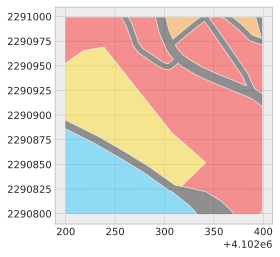

In [252]:
test_cores.plot("ITEM2012",legend=False,cmap=newcmp,legend_kwds={"ncol":2,"fontsize":"small"})

In [259]:
get_stats(gradcam_gdf_rich)

,ITEM2012,count,geometry,max,mean,median,min,sum,area,score,attention_frac,attention_frac_given_area,ratio
0,water,103389,"POLYGON ((4102199.296267374 2290886.341970532,...",0.00198,0.000019,0.000000,0.0,2.006267,6461.149258,0.000311,0.011296,0.004522,0.069931
1,ld UF,11216,(POLYGON ((4102392.444858502 2290999.502251123...,0.00346,0.001181,0.000626,0.0,13.246692,702.039926,0.018869,0.074582,0.274789,4.249490
2,hd UF,12,"POLYGON ((4102399.296796165 2290997.107641597,...",0.00000,0.000000,0.000000,0.0,0.000000,0.760131,0.000000,0.000000,0.000000,0.000000
3,hd UF,16830,"POLYGON ((4102290.828119203 2290999.501973852,...",0.00346,0.000944,0.000626,0.0,15.890540,1051.729069,0.015109,0.089467,0.220034,3.402718
4,hd UF,230898,"POLYGON ((4102255.558299452 2290999.501877614,...",0.00346,0.000162,0.000000,0.0,37.415666,14430.697922,0.002593,0.210658,0.037759,0.583925
5,hd UF,24602,"POLYGON ((4102357.836140835 2290999.502156689,...",0.00346,0.000621,0.000324,0.0,15.281795,1536.350980,0.009947,0.086040,0.144857,2.240140
6,roads,79313,(POLYGON ((4102399.296562158 2290971.343164539...,0.00346,0.000314,0.000000,0.0,24.926255,4960.132483,0.005025,0.140340,0.073184,1.131762
7,hd UF,29894,"POLYGON ((4102346.1174 2290987.0976, 4102368.9...",0.00346,0.000722,0.000408,0.0,21.580904,1868.166912,0.011552,0.121505,0.168232,2.601628
8,comr_indst,143744,"POLYGON ((4102199.296830021 2290952.321797858,...",0.00346,0.000329,0.000074,0.0,47.265476,8983.307748,0.005261,0.266114,0.076623,1.184947
9,green UA,102,"POLYGON ((4102396.278395203 2290799.498393732,...",0.00000,0.000000,0.000000,0.0,0.000000,6.349159,0.000000,0.000000,0.000000,0.000000


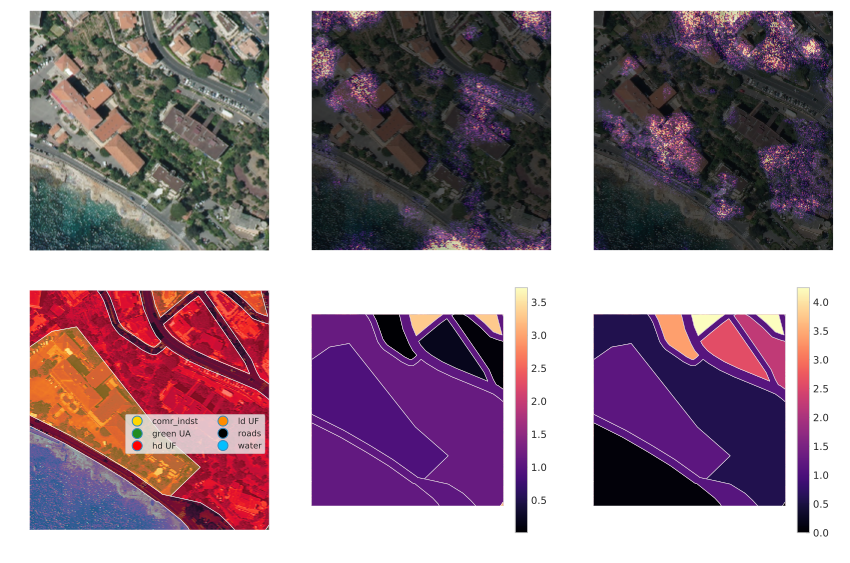

In [267]:
f,axes = plt.subplots(2,3,figsize=(12,8));

axes[0,0].imshow(sample_census_cell_img[:,:,::-1]);
axes[0,0].axis("off");

rasterio.plot.show(sample_census_cell_img[:,:,0],transform=t,ax=axes[1,0]);
test_cores.plot("ITEM2012",legend=True,ax=axes[1,0],cmap=newcmp,legend_kwds={"ncol":2,"fontsize":"small"});
leg = axes[1,0].get_legend()
leg.set_bbox_to_anchor((0.8, 0.4, .2, .1))
axes[1,0].axis("off");

axes[0,1].imshow(batch_sample_census_cell_imgs[0][:,:,::-1]);
axes[0,1].imshow(gradcam_bgs_poor[0], cmap="magma", alpha=0.8);
axes[0,1].axis("off");

axes[0,2].imshow(batch_sample_census_cell_imgs[0][:,:,::-1]);
axes[0,2].imshow(gradcam_bgs_rich[0], cmap="magma", alpha=0.8);
axes[0,2].axis("off");

rasterio.plot.show(sample_census_cell_img[:,:,0],transform=t,ax=axes[1,1]);
get_stats(gradcam_gdf_poor).plot("ratio",legend=True,ax=axes[1,1],cmap="magma");
axes[1,1].axis("off");

rasterio.plot.show(sample_census_cell_img[:,:,0],transform=t,ax=axes[1,2]);
get_stats(gradcam_gdf_rich).plot("ratio",legend=True,ax=axes[1,2],cmap="magma");
axes[1,2].axis("off");
f.tight_layout()

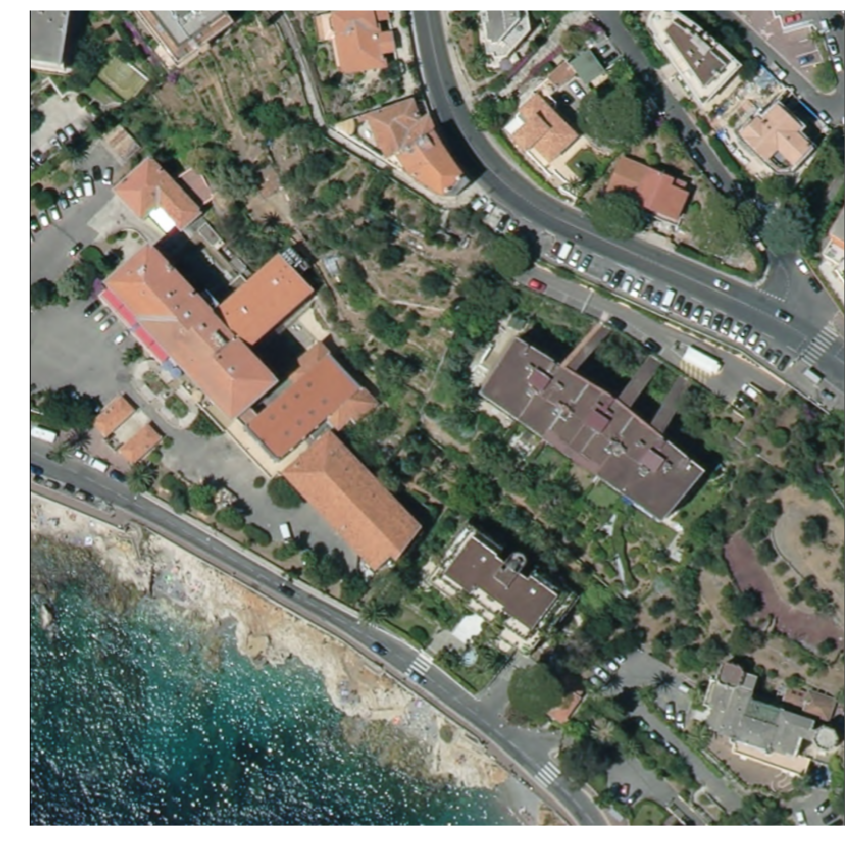

In [184]:
f,ax = plt.subplots(1,1,figsize=(15,15))
plt.imshow(sample_census_cell_img[:,:,::-1]);
plt.axis("off");
plt.savefig("/home/jlevyabi/FIG_9199/ims.pdf",bbox_inches='tight', pad_inches=0.1);

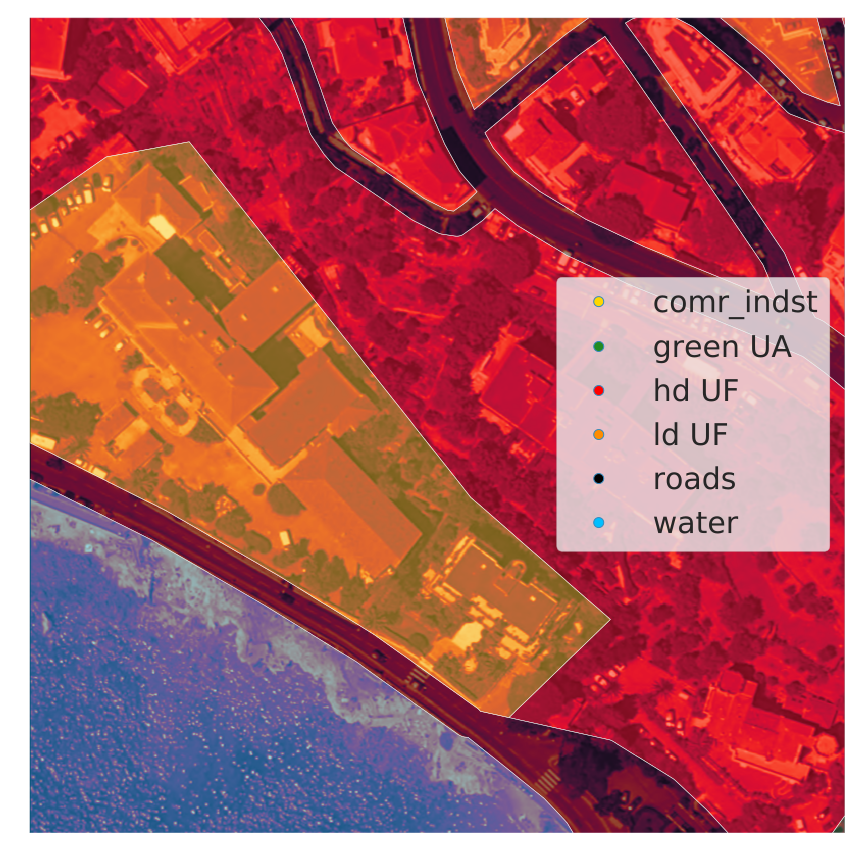

In [227]:
f,ax = plt.subplots(1,1,figsize=(15,15))
rasterio.plot.show(sample_census_cell_img[:,:,0],transform=t,ax=ax);
test_cores.plot("ITEM2012",legend=True,ax=ax,markersize=100, 
                cmap=newcmp,legend_kwds={"ncol":1,'fontsize': 30});

leg = ax.get_legend()
leg.set_bbox_to_anchor((0.6, 0.3, .4, .4))
ax.axis("off");
f.savefig("/home/jlevyabi/FIG_9199/ims_ovr.pdf",bbox_inches='tight', pad_inches=0.1);

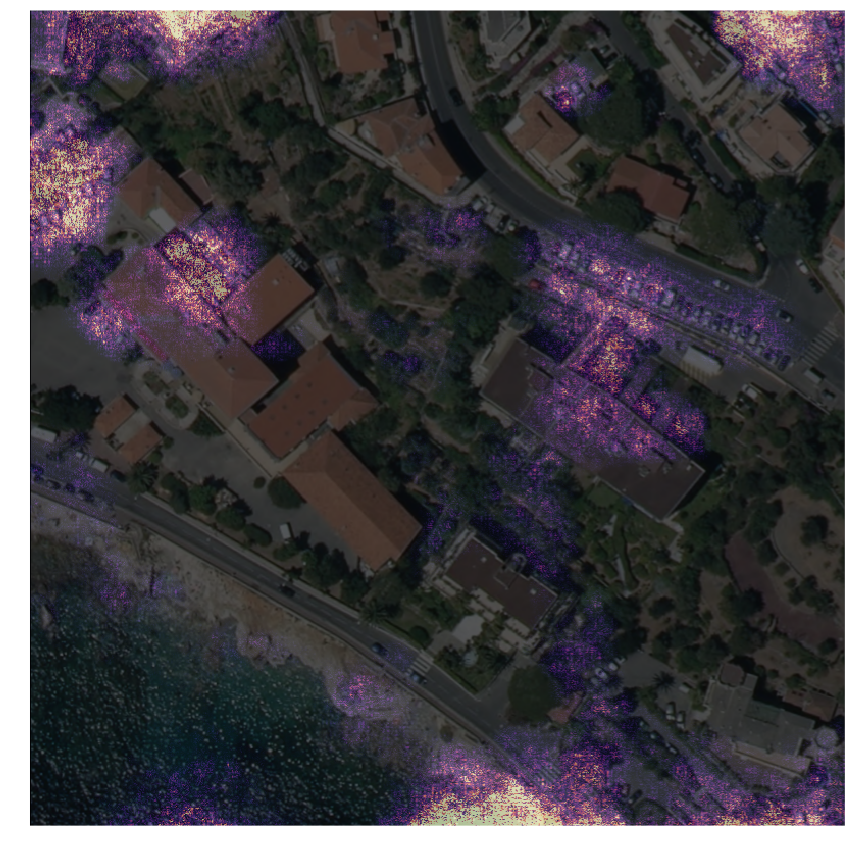

In [186]:
f,ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(batch_sample_census_cell_imgs[0][:,:,::-1]);
ax.imshow(gradcam_bgs_poor[0], cmap="magma", alpha=0.8);
ax.axis("off");
f.savefig("/home/jlevyabi/FIG_9199/ims_bg0.pdf",bbox_inches='tight', pad_inches=0.1);

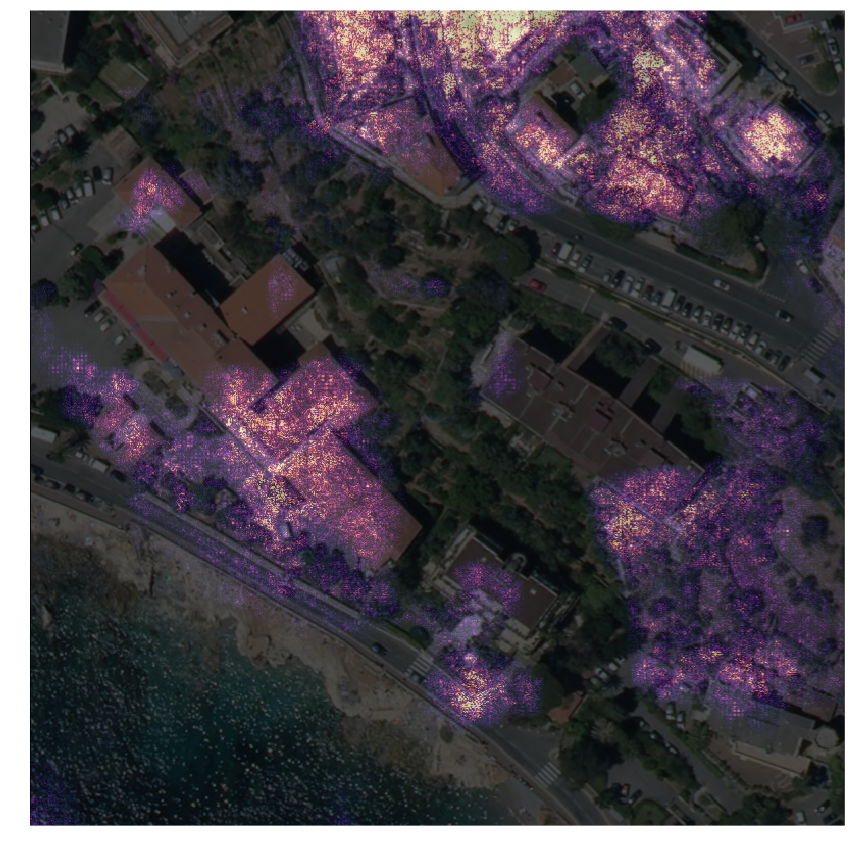

In [187]:
f,ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(batch_sample_census_cell_imgs[0][:,:,::-1]);
ax.imshow(gradcam_bgs_rich[0], cmap="magma", alpha=0.8);
ax.axis("off");
f.savefig("/home/jlevyabi/FIG_9199/ims_bg5.pdf",bbox_inches='tight', pad_inches=0.1);

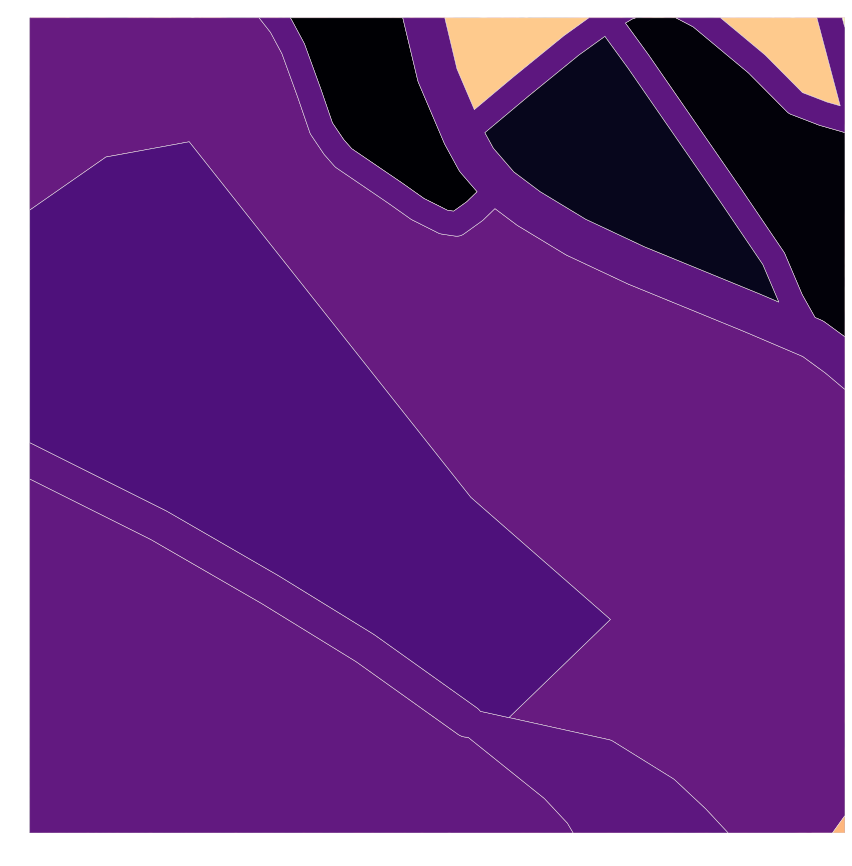

In [270]:
f,ax = plt.subplots(1,1,figsize=(15,15))
rasterio.plot.show(sample_census_cell_img[:,:,0],transform=t,ax=ax);
get_stats(gradcam_gdf_poor).plot("ratio",legend=False,ax=ax,cmap="magma");
ax.axis("off");
f.savefig("/home/jlevyabi/FIG_9199/ims_bg0_ovr.pdf",bbox_inches='tight', pad_inches=0.1);

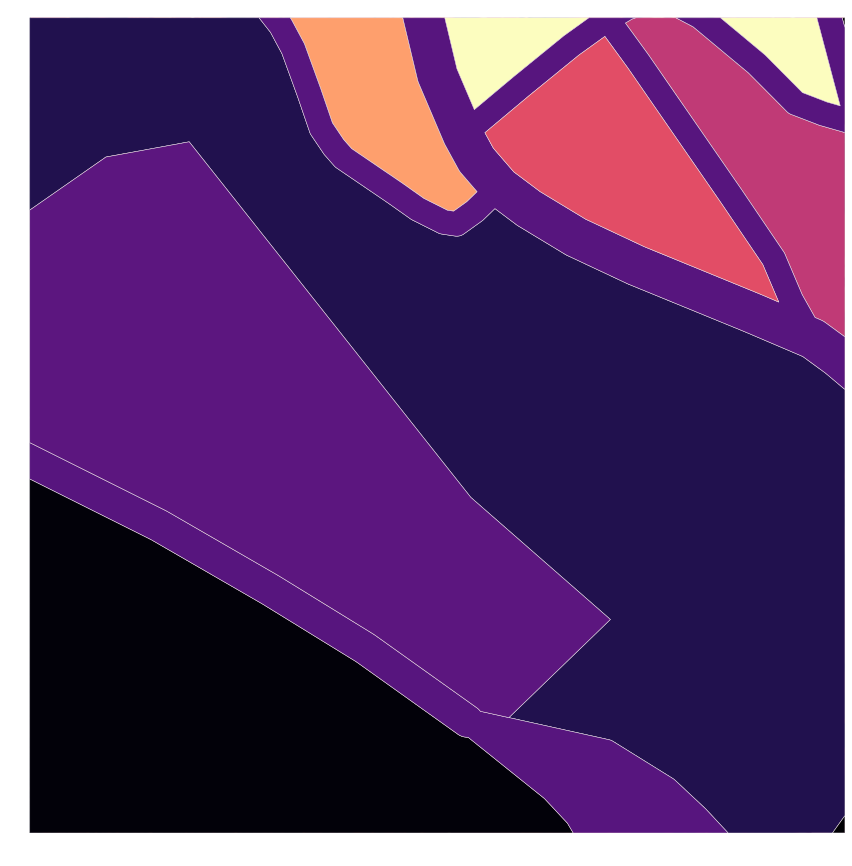

In [271]:
f,ax = plt.subplots(1,1,figsize=(15,15))
rasterio.plot.show(sample_census_cell_img[:,:,0],transform=t,ax=ax);
get_stats(gradcam_gdf_rich).plot("ratio",legend=False,ax=ax,cmap="magma");
ax.axis("off");
f.savefig("/home/jlevyabi/FIG_9199/ims_bg5_ovr.pdf",bbox_inches='tight', pad_inches=0.1);

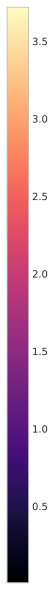

In [272]:
fig = plt.figure(figsize=(10,10))
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=get_stats(gradcam_gdf_poor)["ratio"].min(),
                                                            vmax=get_stats(gradcam_gdf_poor)["ratio"].max()));
# fake up the array of the scalar mappable. Urgh...
sm._A = []
fig.colorbar(sm, cax=cax);
fig.savefig("/home/jlevyabi/FIG_9199/cbar_poor.pdf",bbox_inches='tight', pad_inches=0.1);

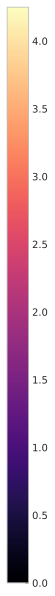

In [273]:
fig = plt.figure(figsize=(10,10))
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=get_stats(gradcam_gdf_rich)["ratio"].min(),
                                                            vmax=get_stats(gradcam_gdf_rich)["ratio"].max()));
# fake up the array of the scalar mappable. Urgh...
sm._A = []
fig.colorbar(sm, cax=cax);
fig.savefig("/home/jlevyabi/FIG_9199/cbar_rich.pdf",bbox_inches='tight', pad_inches=0.1);